# <div style="color:#fff;display:fill;border-radius:10px;background-color:#137aa4;text-align:left;letter-spacing:0.1px;overflow:hidden;padding:40px;color:white;overflow:hidden;margin:0;font-size:100%"> Hackathon DataMining 2023 - Groupe 7 - 🤖🐦</div>

#### This notebook documents the process and results of a hackathon on the subject of Data Mining. It includes the steps taken by the group, including brainstorming, research, planning, execution, and presentation, as well as the results and conclusion of their project. The notebook serves as a record of the group's work and can be used for future reference and analysis.

### We decided to centralize our code on Kaggle notebooks to allow for greater adaptability and collaboration, as well as easy accessibility for corrections. 


# <div style="color:#fff;display:fill;border-radius:10px;background-color:#3c968b;text-align:left;letter-spacing:0.1px;overflow:hidden;padding:20px;color:white;overflow:hidden;margin:0;font-size:100%"> 📋 Table of Contents</div>

* [Libraries](#section-1)
* [Data Loading](#section-2)
* [EDA](#section-3)
* [Data Cleaning](#section-4) 
* [AutoML](#section-5)
* [Predictions](#section-6) 
* [Save](#section-7) 

<a id="section-1"></a>
# <div style="color:#fff;display:fill;border-radius:10px;background-color:#3c968b;text-align:left;letter-spacing:0.1px;overflow:hidden;padding:20px;color:white;overflow:hidden;margin:0;font-size:100%"> 📖 Libraries and color palette</div> 

In [1]:
!pip install xlrd
!pip install pip install autoviz --upgrade
!pip install dataprep
!pip install datacleaner

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.5/96.5 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 32.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.7/64.7 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 44.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 67.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.9/12.9 MB 14.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 65.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 66.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 68.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 12.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 64.3 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 22.3.1
    Uninstalling pip-22.3.1:
      Successfully uninsta

In [2]:
# import the necessary libraries
import pandas as pd
import numpy as np

import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

import matplotlib.pyplot as plt
import seaborn as sns

from pandas_profiling import ProfileReport
from autoviz.AutoViz_Class import AutoViz_Class
from autoviz import data_cleaning_suggestions
from dataprep.clean import clean_df
from datacleaner import autoclean, autoclean_cv

from sklearn.metrics import confusion_matrix
from h2o import h2o
from h2o.automl import H2OAutoML
from sklearn.metrics import classification_report

/opt/conda/lib/python3.7/site-packages/geopandas/_compat.py:115: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


In [3]:
# Defining all our palette colours.
primary_blue = "#496595"
primary_blue2 = "#85a1c1"
primary_blue3 = "#3f4d63"
primary_grey = "#c6ccd8"
primary_black = "#202022"
primary_bgcolor = "#f4f0ea"

primary_green = px.colors.qualitative.Plotly[2]

plt.rcParams['axes.facecolor'] = primary_bgcolor

colors = [primary_blue, primary_blue2, primary_blue3, primary_grey, primary_black, primary_bgcolor, primary_green]
sns.palplot(sns.color_palette(colors))

<a id="section-3"></a>
# <div style="color:#fff;display:fill;border-radius:10px;background-color:#3c968b;text-align:left;letter-spacing:0.1px;overflow:hidden;padding:20px;color:white;overflow:hidden;margin:0;font-size:100%">⬇️ Data Loading</div> 

As part of our research for the hackathon, we downloaded relevant data from the CELENE server and loaded it into our notebook. This allowed us to analyze the data and gain insights that informed our project plan and execution. 

In [4]:
# Paths
train_path = '/kaggle/input/hackathon-2021/telecom_users.csv'
test_path = '/kaggle/input/hackathon-2021/telecom_users_eval.csv'
service_path = '/kaggle/input/hackathon-2021/telecom_services.csv'

# Read the data into a dataframe from the csv files [delimited by ; = sep=';']
train = pd.read_csv(train_path)
test = pd.read_csv(test_path)
service = pd.read_csv(service_path)

In [5]:
# Variable declaration
TARGET = 'sortie_client'
ID = 'id_client'

In [6]:
# Show the shape of the train and test dataframes
print("Train shape : "+train.shape.__str__())
print("Test shape : "+test.shape.__str__())

Train shape : (5786, 15)
Test shape : (200, 14)


In [7]:
# Show columns of the train and test
print("Train columns : "+train.columns.__str__())
print("Test columns : "+test.columns.__str__())

Train columns : Index(['id_client', 'mariee', 'retraite', 'a_charge', 'genre',
       'facture_mensuelle', 'telephone', 'plusieurs_numeros', 'internet',
       'total_factures', 'contrat', 'facture_par_mail', 'type_de_paiement',
       'client_depuis_mois', 'sortie_client'],
      dtype='object')
Test columns : Index(['id_client', 'mariee', 'retraite', 'a_charge', 'genre',
       'facture_mensuelle', 'telephone', 'plusieurs_numeros', 'internet',
       'total_factures', 'contrat', 'facture_par_mail', 'type_de_paiement',
       'client_depuis_mois'],
      dtype='object')


In [8]:
# merge the train and service dataframes on the column "id_client" and the test and service dataframes on the column "id_client"
train = train.merge(service, how='left', left_on=ID, right_on=ID)
test = test.merge(service, how='left', left_on=ID, right_on=ID)

In [9]:
# Show the shape of the train and test dataframes
print("Train shape : "+train.shape.__str__())
print("Test shape : "+test.shape.__str__())
# Show columns of the train and test
print("Train columns : "+train.columns.__str__())
print("Test columns : "+test.columns.__str__())

Train shape : (5786, 21)
Test shape : (200, 20)
Train columns : Index(['id_client', 'mariee', 'retraite', 'a_charge', 'genre',
       'facture_mensuelle', 'telephone', 'plusieurs_numeros', 'internet',
       'total_factures', 'contrat', 'facture_par_mail', 'type_de_paiement',
       'client_depuis_mois', 'sortie_client', 'service_sauvegarde',
       'service_antivirus', 'service_assurance', 'service_streaming_film',
       'service_streaming_tv', 'service_support'],
      dtype='object')
Test columns : Index(['id_client', 'mariee', 'retraite', 'a_charge', 'genre',
       'facture_mensuelle', 'telephone', 'plusieurs_numeros', 'internet',
       'total_factures', 'contrat', 'facture_par_mail', 'type_de_paiement',
       'client_depuis_mois', 'service_sauvegarde', 'service_antivirus',
       'service_assurance', 'service_streaming_film', 'service_streaming_tv',
       'service_support'],
      dtype='object')


<a id="section-2"></a>
# <div style="color:#fff;display:fill;border-radius:10px;background-color:#3c968b;text-align:left;letter-spacing:0.1px;overflow:hidden;padding:20px;color:white;overflow:hidden;margin:0;font-size:100%">💹 Exploratory data analysis</div> 


In [10]:
%matplotlib inline
# AV = AutoViz_Class()
# # Use the AutoViz class to generate a report on the dataframe
# filename = AV.AutoViz(filename='', depVar=TARGET, dfte=train, chart_format='bokeh')
data_cleaning_suggestions(train)

Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
id_client,5786,object,0,0.000000,100.000000,1,"combine rare categories, possible ID column: drop"
total_factures,5437,float64,10,0.172831,93.968199,0,fill missing
facture_mensuelle,1511,float64,0,0.000000,26.114760,0,
client_depuis_mois,73,int64,0,0.000000,1.261666,0,
type_de_paiement,4,object,0,0.000000,0.069132,1257,
plusieurs_numeros,3,object,0,0.000000,0.051849,570,
internet,3,object,0,0.000000,0.051849,1252,
contrat,3,object,0,0.000000,0.051849,1238,
telephone,2,object,0,0.000000,0.034566,570,
genre,2,object,0,0.000000,0.034566,2844,


In [11]:
data_cleaning_suggestions(test)

Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
id_client,200,object,0,0.000000,100.000000,1,"combine rare categories, possible ID column: drop"
total_factures,197,float64,0,0.000000,98.500000,0,
facture_mensuelle,180,float64,0,0.000000,90.000000,0,
client_depuis_mois,63,int64,0,0.000000,31.500000,0,
type_de_paiement,4,object,0,0.000000,2.000000,41,
plusieurs_numeros,3,object,0,0.000000,1.500000,20,
internet,3,object,0,0.000000,1.500000,39,
contrat,3,object,0,0.000000,1.500000,38,
telephone,2,object,0,0.000000,1.000000,20,
genre,2,object,0,0.000000,1.000000,92,


In [12]:
data_profile_train = ProfileReport(train, title='Hackathon Train data Profile Report',dark_mode=True, explorative=True)
data_profile_test = ProfileReport(test, title='Hackathon Test data Profile Report',dark_mode=True, explorative=True)
comparison_report = data_profile_train.compare(data_profile_test)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

In [13]:
comparison_report

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<a id="section-4"></a>
# <div style="color:#fff;display:fill;border-radius:10px;background-color:#3c968b;text-align:left;letter-spacing:0.1px;overflow:hidden;padding:20px;color:white;overflow:hidden;margin:0;font-size:100%">🧹 Data Cleaning</div> 

In [14]:
# inferred_dtypes_train, cleaned_train = clean_df(train)
# inferred_dtypes_test, cleaned_test = clean_df(test)

In [15]:
# Extract the target from the train dataframe and drop the column
targets = train[TARGET]
train.drop(TARGET, axis=1, inplace=True)

In [16]:
ids_train = train[ID]
train.drop(ID, axis=1, inplace=True)
ids_test = test[ID]
test.drop(ID, axis=1, inplace=True)

In [17]:
# Show the shape of the train and test dataframes
print("Train shape : "+train.shape.__str__())
print("Test shape : "+test.shape.__str__())
# Show columns of the train and test
print("Train columns : "+train.columns.__str__())
print("Test columns : "+test.columns.__str__())

Train shape : (5786, 19)
Test shape : (200, 19)
Train columns : Index(['mariee', 'retraite', 'a_charge', 'genre', 'facture_mensuelle',
       'telephone', 'plusieurs_numeros', 'internet', 'total_factures',
       'contrat', 'facture_par_mail', 'type_de_paiement', 'client_depuis_mois',
       'service_sauvegarde', 'service_antivirus', 'service_assurance',
       'service_streaming_film', 'service_streaming_tv', 'service_support'],
      dtype='object')
Test columns : Index(['mariee', 'retraite', 'a_charge', 'genre', 'facture_mensuelle',
       'telephone', 'plusieurs_numeros', 'internet', 'total_factures',
       'contrat', 'facture_par_mail', 'type_de_paiement', 'client_depuis_mois',
       'service_sauvegarde', 'service_antivirus', 'service_assurance',
       'service_streaming_film', 'service_streaming_tv', 'service_support'],
      dtype='object')


In [18]:
train_clean, test_clean = autoclean_cv(train, test)

In [19]:
# Show the shape of the train and test dataframes
print("Train shape : "+train_clean.shape.__str__())
print("Test shape : "+test_clean.shape.__str__())
# Show columns of the train and test
print("Train columns : "+train_clean.columns.__str__())
print("Test columns : "+test_clean.columns.__str__())

Train shape : (5786, 19)
Test shape : (200, 19)
Train columns : Index(['mariee', 'retraite', 'a_charge', 'genre', 'facture_mensuelle',
       'telephone', 'plusieurs_numeros', 'internet', 'total_factures',
       'contrat', 'facture_par_mail', 'type_de_paiement', 'client_depuis_mois',
       'service_sauvegarde', 'service_antivirus', 'service_assurance',
       'service_streaming_film', 'service_streaming_tv', 'service_support'],
      dtype='object')
Test columns : Index(['mariee', 'retraite', 'a_charge', 'genre', 'facture_mensuelle',
       'telephone', 'plusieurs_numeros', 'internet', 'total_factures',
       'contrat', 'facture_par_mail', 'type_de_paiement', 'client_depuis_mois',
       'service_sauvegarde', 'service_antivirus', 'service_assurance',
       'service_streaming_film', 'service_streaming_tv', 'service_support'],
      dtype='object')


In [20]:
data_profile_train_clean = ProfileReport(train, title='Hackathon Train cleaned data Profile Report',dark_mode=True, explorative=True)
data_profile_test_clean = ProfileReport(test, title='Hackathon Test cleaned data Profile Report',dark_mode=True, explorative=True)
comparison_report_clean = data_profile_train_clean.compare(data_profile_test_clean)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

In [21]:
data_cleaning_suggestions(train_clean)

Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
total_factures,5438,float64,0,0.000000,93.985482,0,
facture_mensuelle,1511,float64,0,0.000000,26.114760,0,
client_depuis_mois,73,int64,0,0.000000,1.261666,0,
type_de_paiement,4,int64,0,0.000000,0.069132,0,
contrat,3,int64,0,0.000000,0.051849,0,
plusieurs_numeros,3,int64,0,0.000000,0.051849,0,
internet,3,int64,0,0.000000,0.051849,0,
service_streaming_tv,2,int64,0,0.000000,0.034566,0,
service_streaming_film,2,int64,0,0.000000,0.034566,0,
service_assurance,2,int64,0,0.000000,0.034566,0,


In [22]:
data_cleaning_suggestions(test_clean)

Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
total_factures,197,float64,0,0.000000,98.500000,0,
facture_mensuelle,180,float64,0,0.000000,90.000000,0,
client_depuis_mois,63,int64,0,0.000000,31.500000,0,
type_de_paiement,4,int64,0,0.000000,2.000000,0,
contrat,3,int64,0,0.000000,1.500000,0,
plusieurs_numeros,3,int64,0,0.000000,1.500000,0,
internet,3,int64,0,0.000000,1.500000,0,
service_streaming_tv,2,int64,0,0.000000,1.000000,0,
service_streaming_film,2,int64,0,0.000000,1.000000,0,
service_assurance,2,int64,0,0.000000,1.000000,0,


In [23]:
comparison_report_clean

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [24]:
# Rejoin targets and train
train_clean = pd.concat([train_clean, targets], axis=1)

<a id="section-5"></a>
# <div style="color:#fff;display:fill;border-radius:10px;background-color:#3c968b;text-align:left;letter-spacing:0.1px;overflow:hidden;padding:20px;color:white;overflow:hidden;margin:0;font-size:100%">🤖 AutoML - H2O </div> 

In [25]:
# Start h2o
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /opt/conda/lib/python3.7/site-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpx1f4sybn
  JVM stdout: /tmp/tmpx1f4sybn/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpx1f4sybn/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.2
H2O_cluster_version_age:,1 month
H2O_cluster_name:,H2O_from_python_unknownUser_71hfe8
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,7.500 Gb
H2O_cluster_total_cores:,4
H2O_cluster_allowed_cores:,4
H2O_cluster_status:,"locked, healthy"


In [26]:
# Convert the dataframe to h2o dataframe
df_h2o = h2o.H2OFrame(train_clean)
df_h2o_test = h2o.H2OFrame(test_clean)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [27]:
x = df_h2o.columns # Put all columns all dataset train in an array named x
y = TARGET # Call the name of the target
x.remove(y) # Remove target from x

# Drop collums we don't care -> ids ...
drop_columns = ['id_client'] 
x = [i for i in x if i not in drop_columns]

In [28]:
# Select the y column as the target
df_h2o[y] = df_h2o[y].asfactor()
# df_h2o_test[y] = df_h2o_test[y].asfactor()

In [29]:
# Set the parameters
# Documentation is here : https://docs.h2o.ai/h2o/latest-stable/h2o-docs/automl.html
aml = H2OAutoML(seed=2023,# To reproduce the same schema
                nfolds = 3 , # Cross Validation
                max_models = 30, # Number of models will be tested
                exclude_algos = ["DeepLearning"],# Model we don't want to try a fit - possible : StackedEnsemble, GBM, XGBoost, GLM, DRF 
                # include_algos = ["XGBoost"], # The same but for target algos 
                # max_runtime_secs = 300, #  maximum time that the AutoML process will run for
                # balance_classes = True, # minority classes to balance
                max_runtime_secs_per_model = 80, # it's litterally what the name say
                )

# Train the model
aml.train(x=x, y=y, training_frame=df_h2o)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


key,value
Stacking strategy,cross_validation
Number of base models (used / total),3/5
# GBM base models (used / total),1/1
# XGBoost base models (used / total),1/1
# GLM base models (used / total),1/1
# DRF base models (used / total),0/2
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,3
Metalearner fold_column,None


In [30]:
# Get the leaderboard
lb = aml.leaderboard
lb.head(rows=lb.nrows)

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
StackedEnsemble_BestOfFamily_1_AutoML_1_20230409_182125,0.842044,0.419333,0.650674,0.236645,0.369383,0.136444
StackedEnsemble_AllModels_1_AutoML_1_20230409_182125,0.840962,0.420251,0.650063,0.243444,0.369893,0.136821
GBM_grid_1_AutoML_1_20230409_182125_model_2,0.83925,0.422303,0.649113,0.240793,0.370849,0.137529
XGBoost_grid_1_AutoML_1_20230409_182125_model_11,0.838672,0.423606,0.6445,0.239205,0.371546,0.138047
XGBoost_grid_1_AutoML_1_20230409_182125_model_10,0.838642,0.423413,0.645973,0.237138,0.37147,0.13799
XGBoost_grid_1_AutoML_1_20230409_182125_model_8,0.838176,0.424139,0.643553,0.238992,0.372134,0.138484
GBM_grid_1_AutoML_1_20230409_182125_model_5,0.838106,0.423305,0.644389,0.246187,0.371311,0.137872
GBM_1_AutoML_1_20230409_182125,0.837547,0.423807,0.647832,0.252167,0.371454,0.137978
XGBoost_grid_1_AutoML_1_20230409_182125_model_5,0.837437,0.425703,0.642637,0.238549,0.372547,0.138791
XGBoost_grid_1_AutoML_1_20230409_182125_model_12,0.837102,0.42588,0.639779,0.246668,0.37256,0.138801


#### Ensemble Exploration

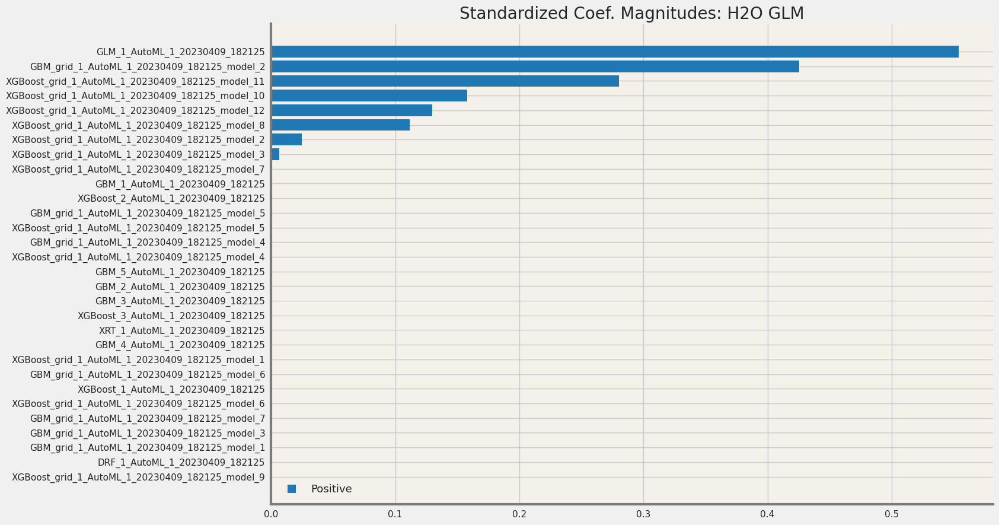

In [31]:
%matplotlib inline
# Get model ids for all models in the AutoML Leaderboard
model_ids = list(aml.leaderboard['model_id'].as_data_frame().iloc[:,0])
# Get the "All Models" Stacked Ensemble model
se = h2o.get_model([mid for mid in model_ids if "StackedEnsemble_AllModels" in mid][0])
# Get the Stacked Ensemble metalearner model
metalearner = se.metalearner()

metalearner.std_coef_plot()

<a id="section-6"></a>
# <div style="color:#fff;display:fill;border-radius:10px;background-color:#3c968b;text-align:left;letter-spacing:0.1px;overflow:hidden;padding:20px;color:white;overflow:hidden;margin:0;font-size:100%">🎲 Predictions</div> 


In [32]:
# Take the best model
model = aml.leader

# Predict the test data
pred = model.predict(df_h2o_test)

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


<a id="section-7"></a>
# <div style="color:#fff;display:fill;border-radius:10px;background-color:#3c968b;text-align:left;letter-spacing:0.1px;overflow:hidden;padding:20px;color:white;overflow:hidden;margin:0;font-size:100%">💾 Save the work</div> 


#### Save the predictions

In [33]:
# Convert the h2o dataframe to pandas dataframe
pred_df = pred.as_data_frame()

# Get the predictions
y_pred_df = pred_df['predict'].values
#y_test_df = df_h2o_test[TARGET].as_data_frame().values

In [34]:
# # Get the classification report in a dataframe
# report = classification_report(y_test_df, y_pred_df, output_dict=True)
# report = pd.DataFrame(report).transpose()
# report

In [35]:
# # Get the confusion matrix plot
# cm = confusion_matrix(y_test, y_pred)
# sns.heatmap(cm, annot=True, fmt='d')
# plt.show()

In [36]:
# Export the predictions in a txt file with in the first line the ID = "700641" and the second line are the positive and negative class predictions represented by 0 and 1 in the sameorder as the pairs points from the csv
# print the first 10 predictions
print(y_pred_df[:10])
# convert y_pred NO to 0 and 1 to YES
y_pred_2 = np.where(y_pred_df == 'No', 0, 1)
# print the first 10 predictions
print(y_pred_2[:10])
# to string with a space between each element
y_pred_2 = ' '.join(y_pred_2.astype(str))
# print the first 10 predictions
print(y_pred_2[:10])
# ID before the predictions and a new line
y_pred_2 = '700641' + '\n' + y_pred_2
# save the predictions in a txt file
with open('/kaggle/working/prediction.txt', 'w') as f:
    f.write(y_pred_2)

['No' 'No' 'No' 'No' 'Yes' 'No' 'Yes' 'No' 'Yes' 'Yes']
[0 0 0 0 1 0 1 0 1 1]
0 0 0 0 1 


#### Save the model

In [37]:
# h2o.save_model(aml.leader, path = "./product_backorders_model_bin")

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## StackedEnsemble_BestOfFamily_1_AutoML_1_20230409_182125

,No,Yes,Error,Rate
No,3288.0,964.0,0.2267,(964.0/4252.0)
Yes,306.0,1228.0,0.1995,(306.0/1534.0)
Total,3594.0,2192.0,0.2195,(1270.0/5786.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

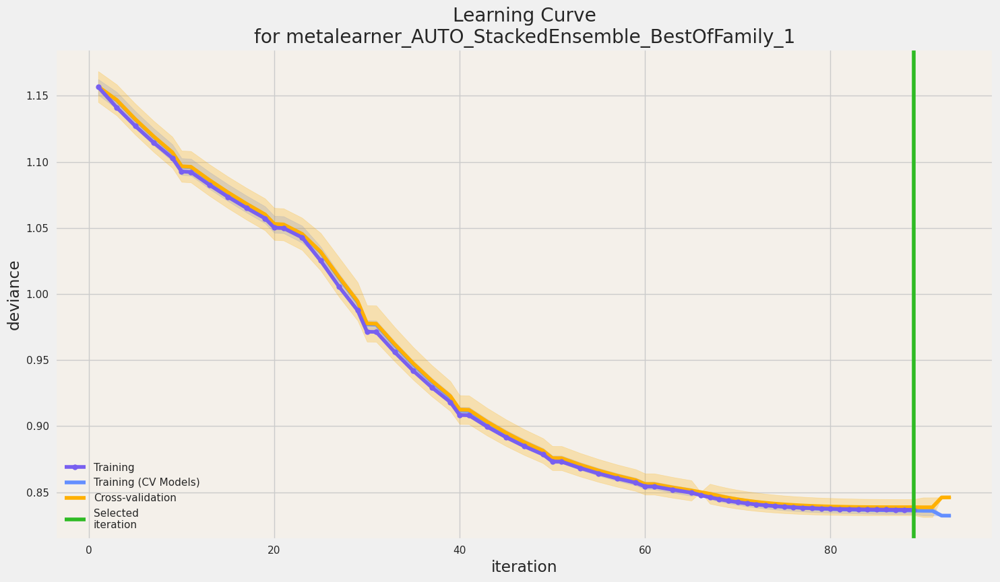

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

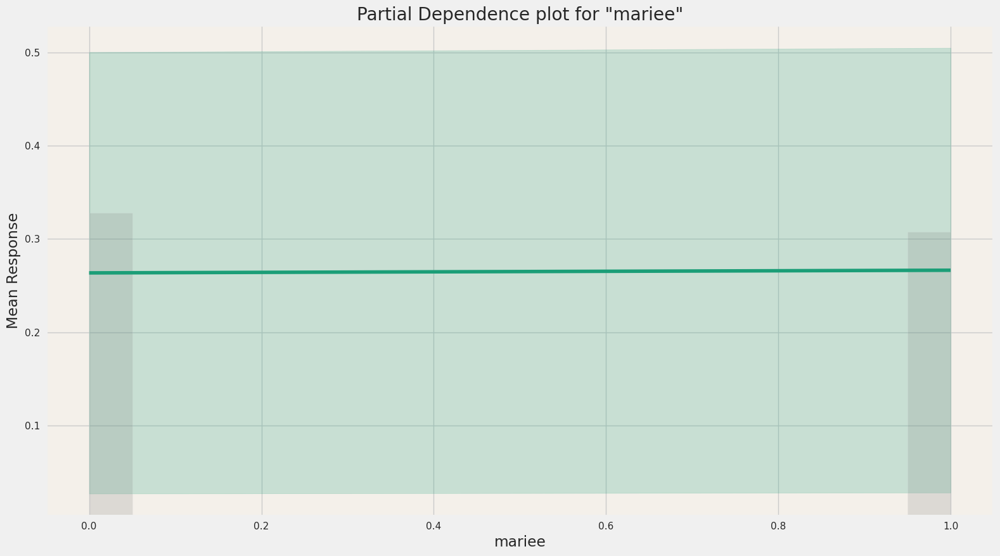

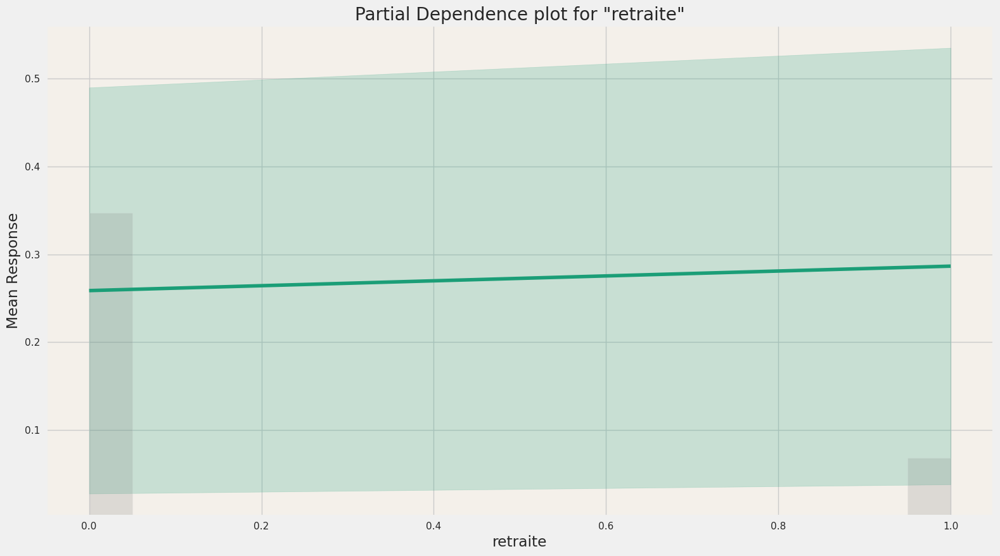

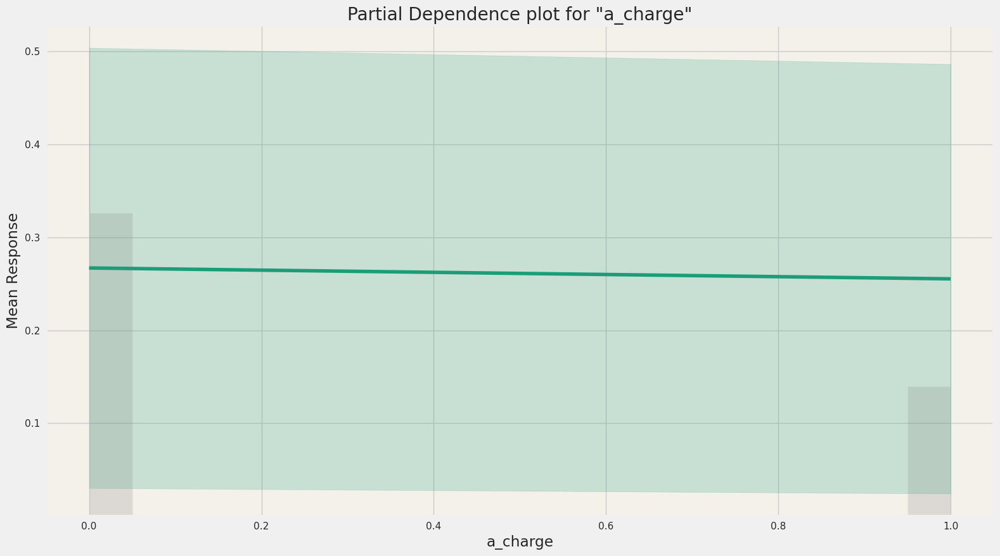

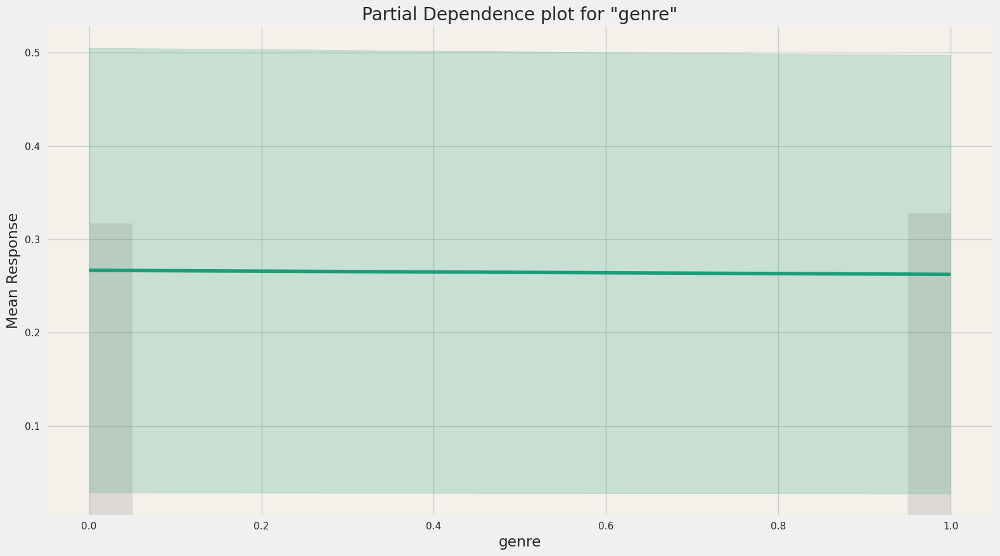

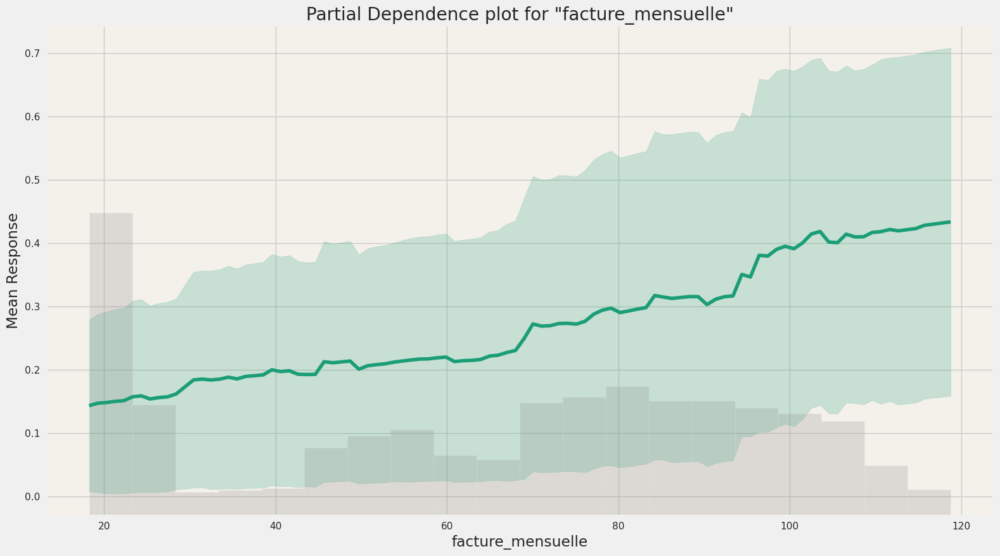

...

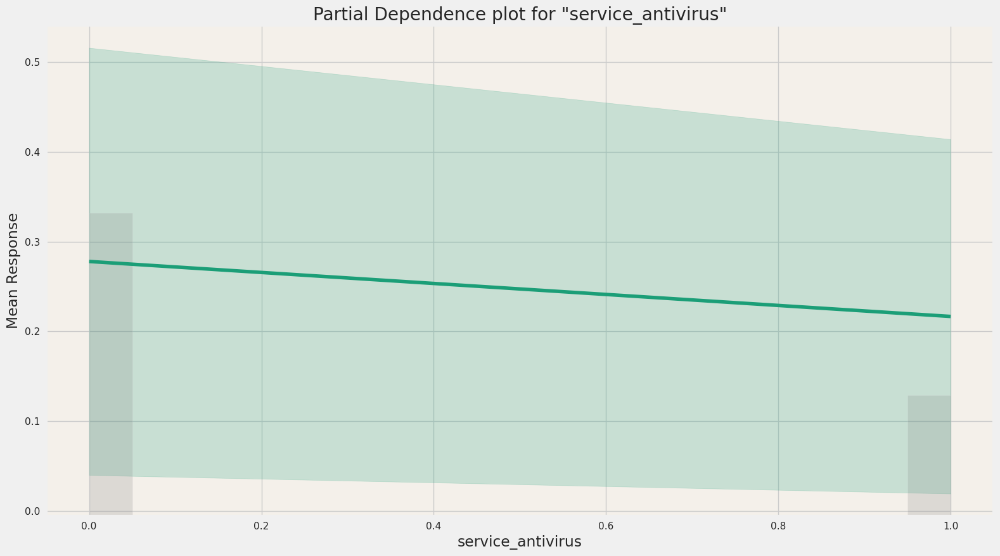

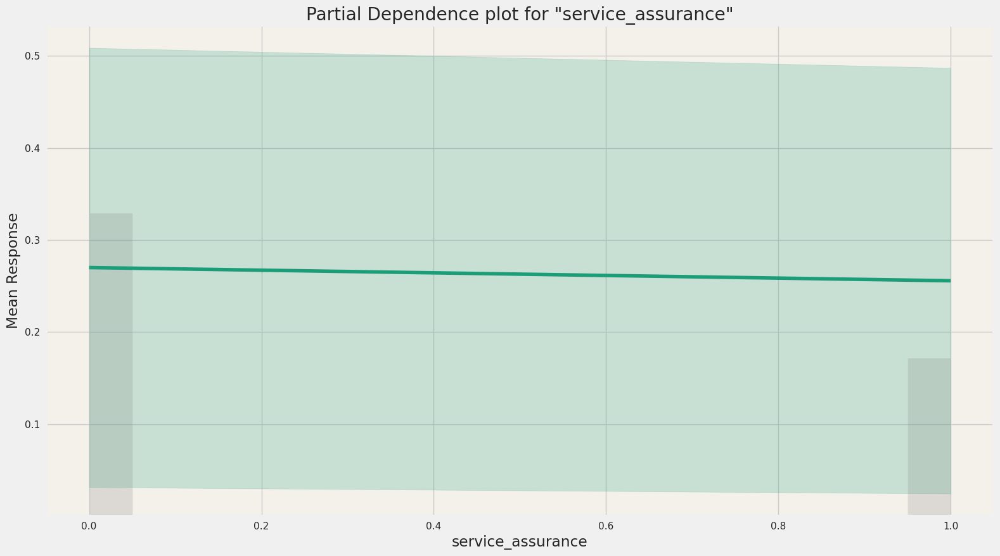

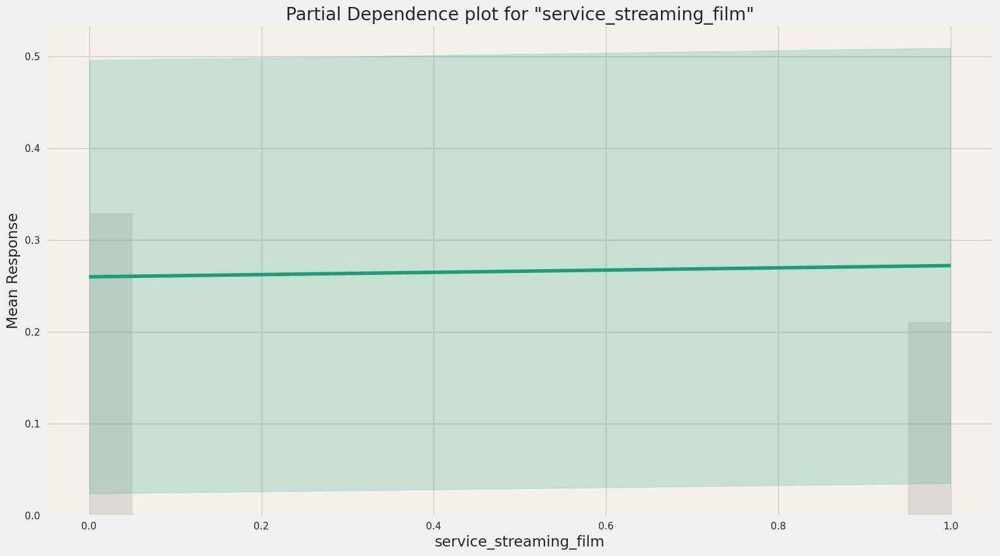

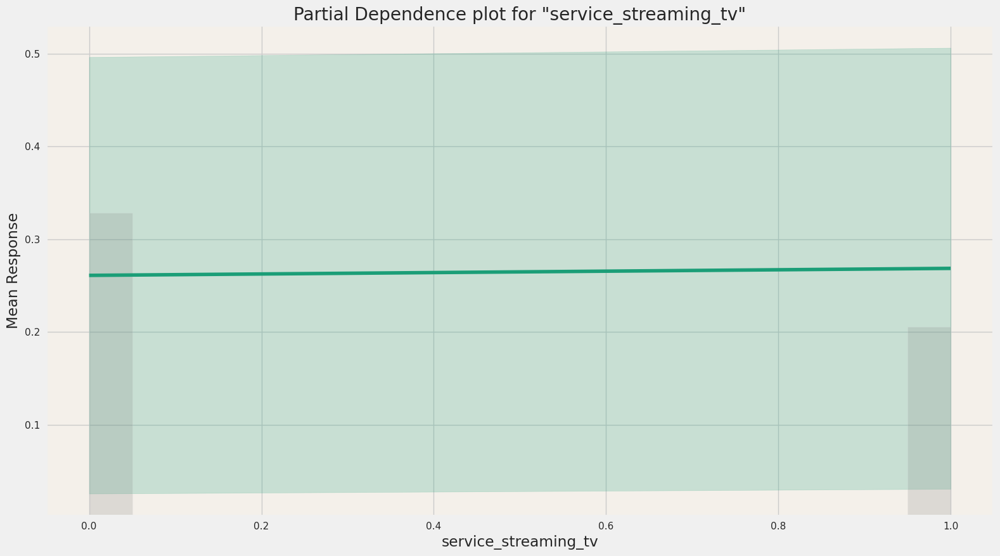

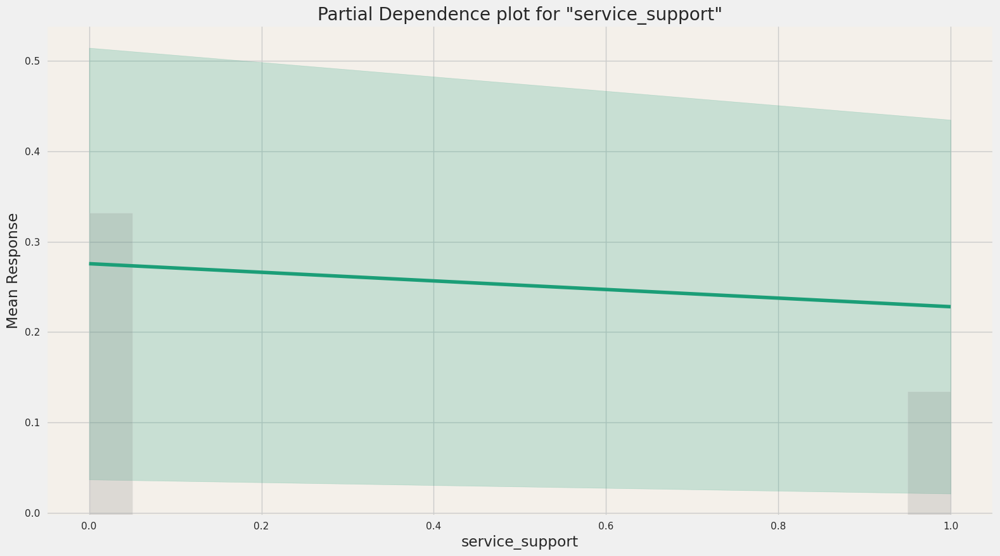

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## StackedEnsemble_BestOfFamily_1_AutoML_1_20230409_182125

,No,Yes,Error,Rate
No,3288.0,964.0,0.2267,(964.0/4252.0)
Yes,306.0,1228.0,0.1995,(306.0/1534.0)
Total,3594.0,2192.0,0.2195,(1270.0/5786.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

In [38]:
model.explain(df_h2o)